In [1]:
# Import libraries with respect to loading data and creating a random forest model
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV  
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_squared_log_error  
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_poisson_deviance


In [2]:
# Load the data from a csv file, and the name of the file is diabetes.csv
data = pd.read_csv('diabetes.csv')

In [3]:
# Mathematical operations on the dataset, like generating the birth year from Age
data['BirthYear'] = 2021 - data['Age']


In [4]:
# Show the new column
print(data['BirthYear'])

0       2000
1       1998
2       1998
3       1978
4       1999
        ... 
9995    1990
9996    1987
9997    1978
9998    1995
9999    1998
Name: BirthYear, Length: 10000, dtype: int64


In [5]:
# convert the BMI column to two decimal values
data['BMI'] = data['BMI'].apply(lambda x: round(x, 2))


In [6]:
# Show the new column only
print(data['BMI'])


0       43.51
1       21.24
2       41.51
3       29.58
4       42.60
        ...  
9995    18.50
9996    21.87
9997    30.77
9998    18.81
9999    38.84
Name: BMI, Length: 10000, dtype: float64


In [7]:
# Perform count, min, max, std, mean, 25%, 50%, and 75% on the dataset
print(data.describe())


          PatientID  Pregnancies  PlasmaGlucose  DiastolicBloodPressure  \
count  1.000000e+04  10000.00000   10000.000000            10000.000000   
mean   1.502122e+06      3.25580     107.850200               71.207500   
std    2.892868e+05      3.40572      31.920909               16.801478   
min    1.000038e+06      0.00000      44.000000               24.000000   
25%    1.251672e+06      0.00000      84.000000               58.000000   
50%    1.504394e+06      2.00000     105.000000               72.000000   
75%    1.754608e+06      6.00000     129.000000               85.000000   
max    1.999997e+06     14.00000     192.000000              117.000000   

       TricepsThickness  SerumInsulin           BMI  DiabetesPedigree  \
count       10000.00000  10000.000000  10000.000000      10000.000000   
mean           28.81760    139.243600     31.567058          0.400944   
std            14.50648    133.777919      9.804377          0.381463   
min             7.00000     14.0

In [8]:
# Split the data into training and testing data and the column name Diabetic is the target column   
X = data.drop('Diabetic', axis=1)
y = data['Diabetic']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    

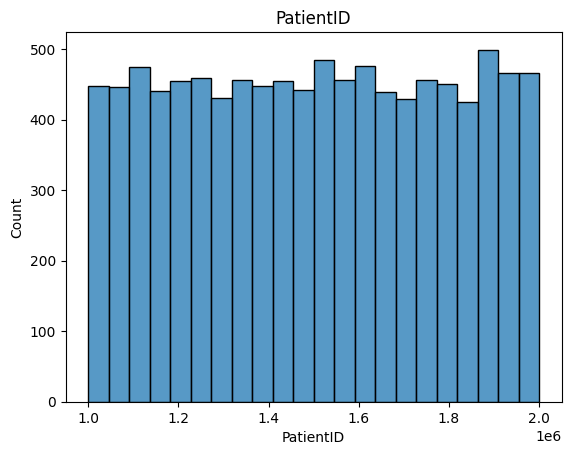

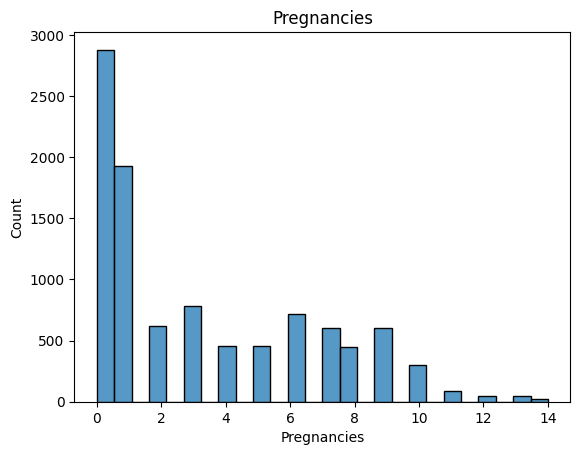

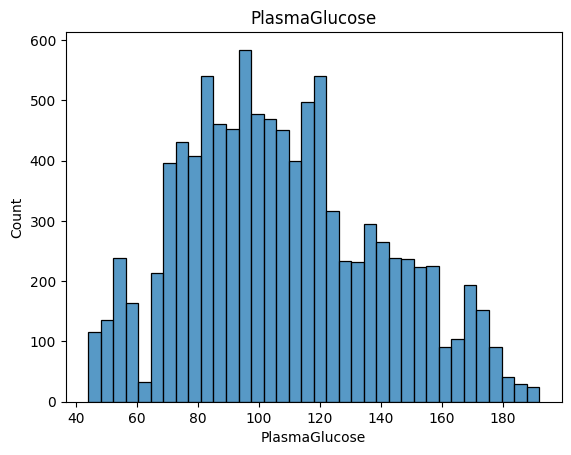

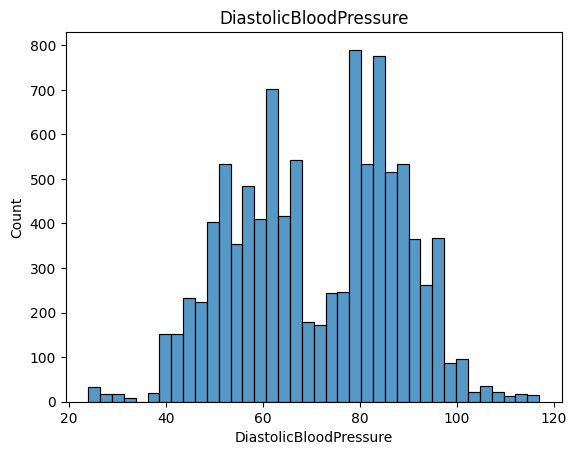

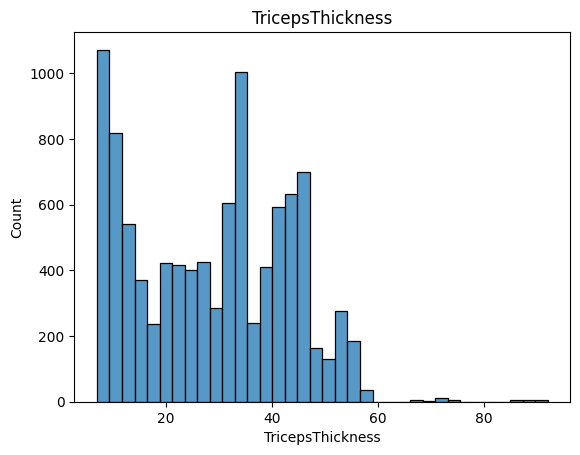

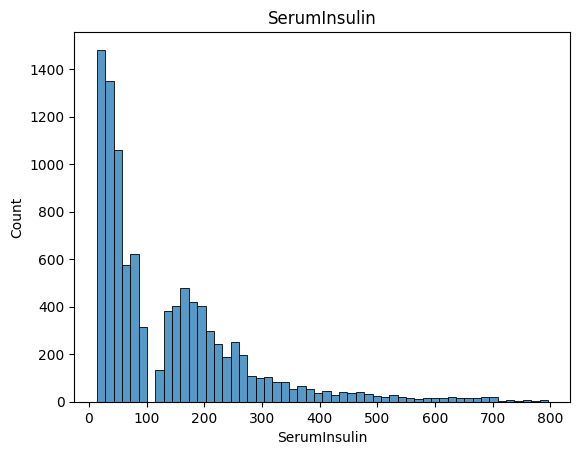

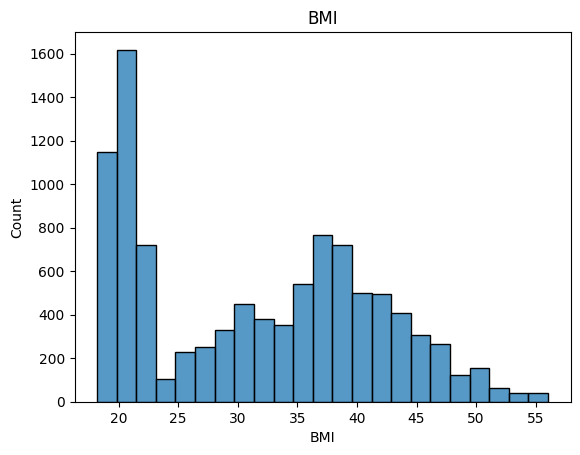

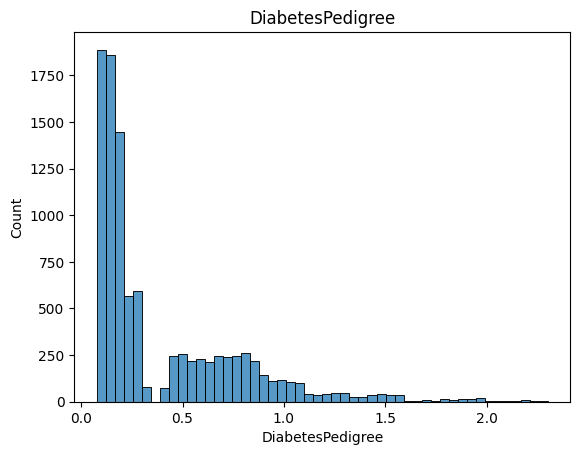

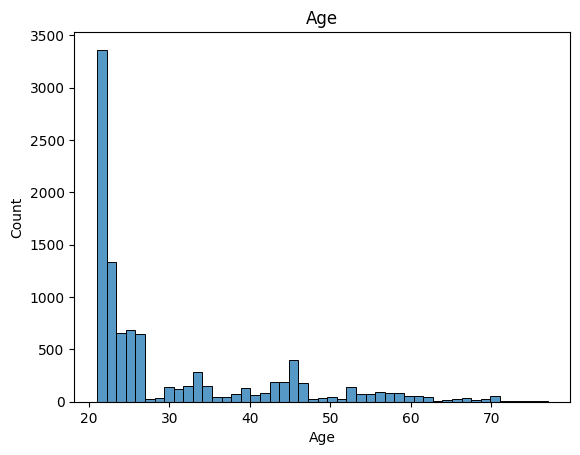

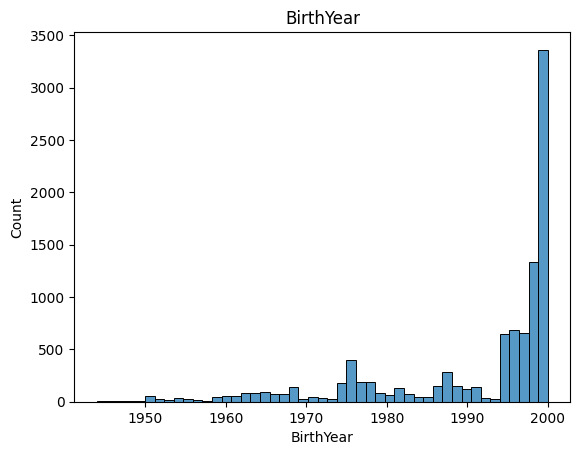

In [9]:
# Perform univariate analysis on the dataset and plot the graphs
for column in X.columns:
    sns.histplot(data[column])
    plt.title(column)
    plt.show()
    

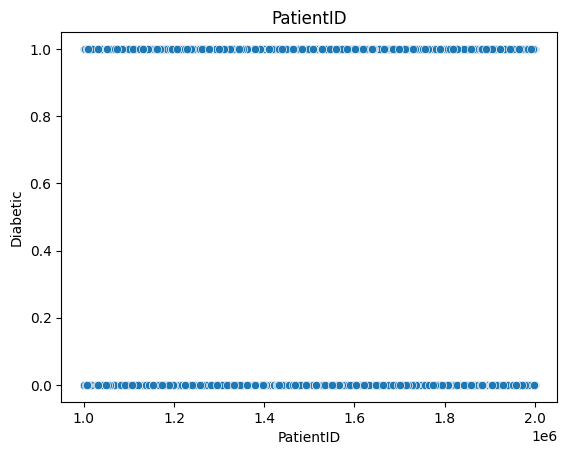

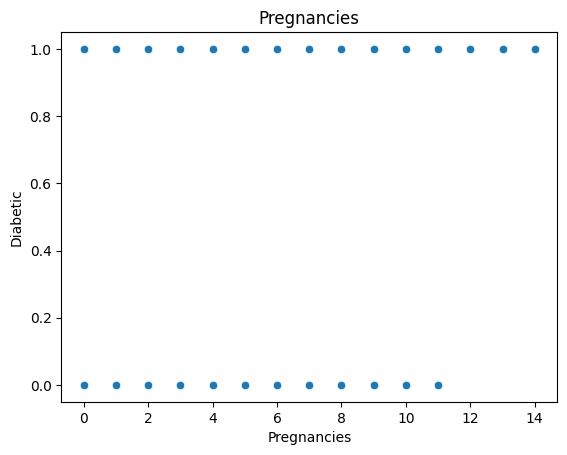

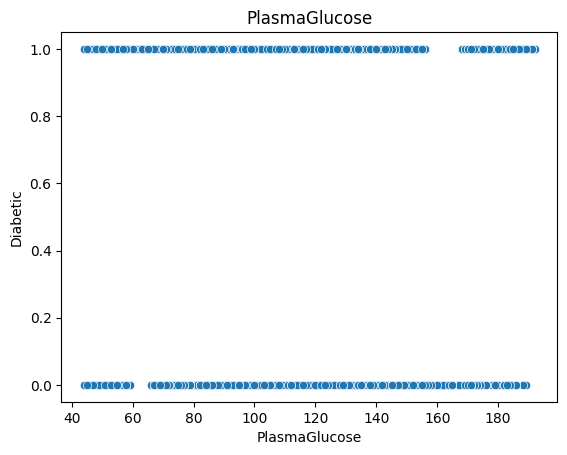

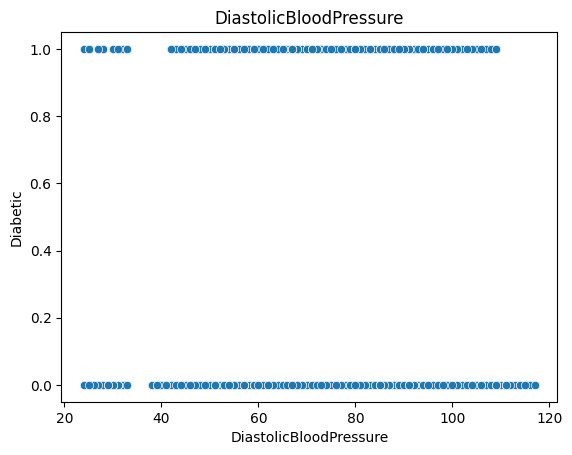

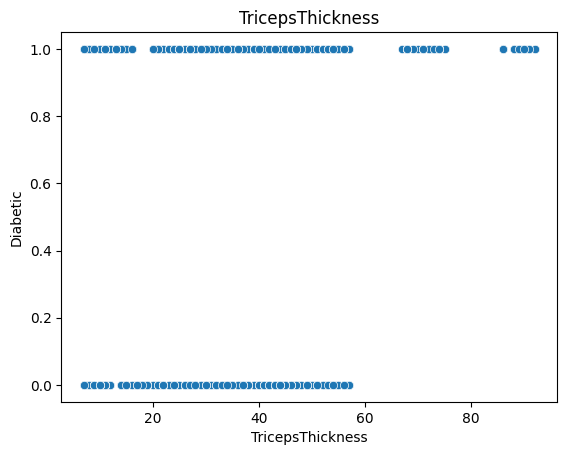

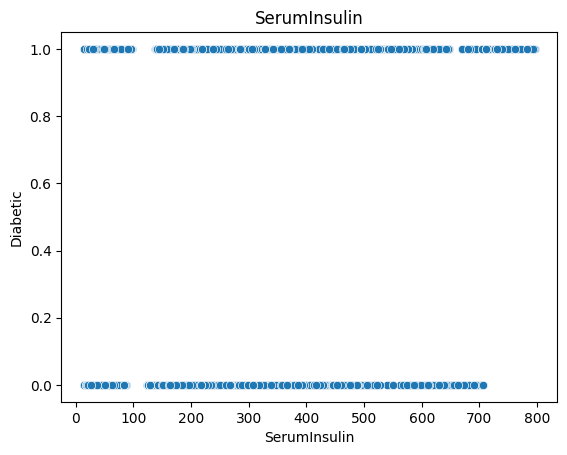

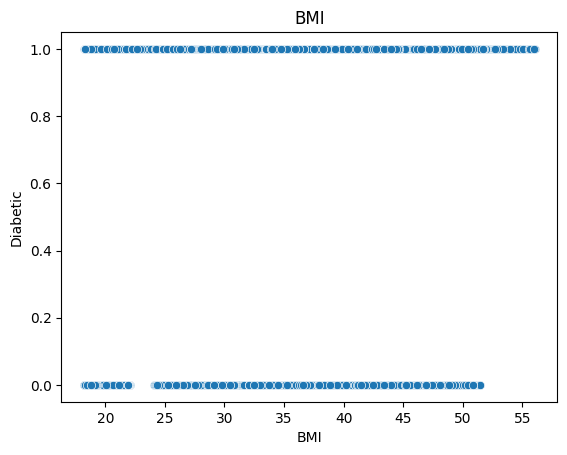

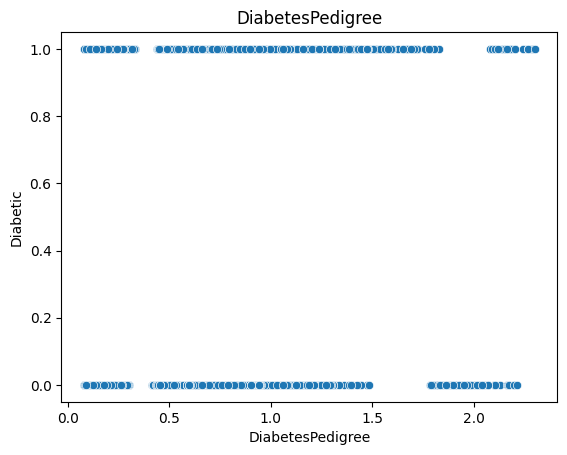

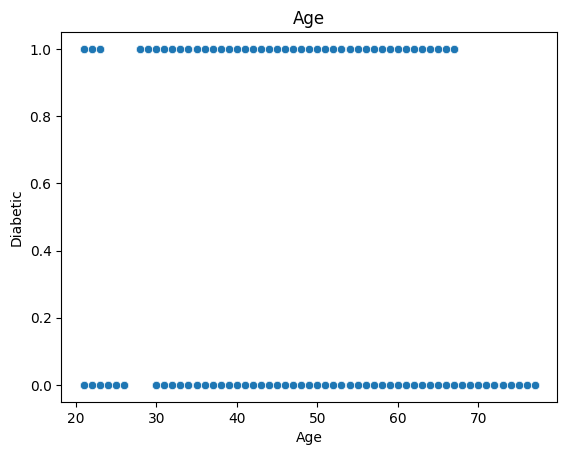

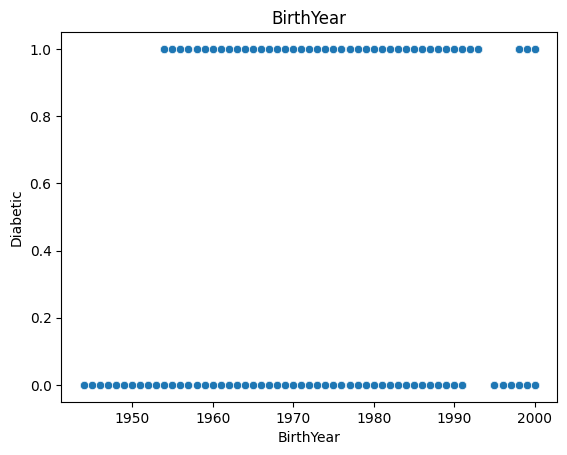

In [11]:
for column in X.columns:
    sns.scatterplot(x=data[column], y=y)
    plt.title(column)
    plt.show()

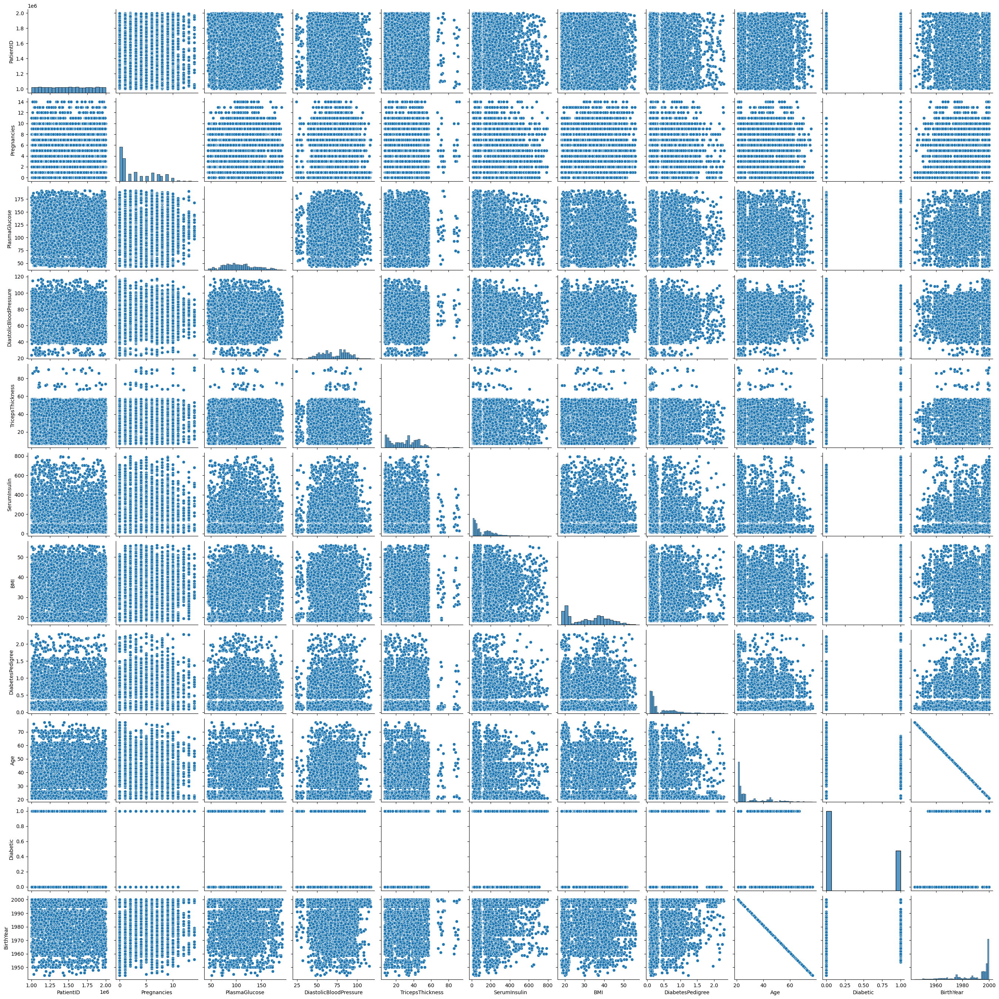

In [12]:
# Perform scatter plot on the dataset and plot the graphs
sns.pairplot(data)
plt.show()


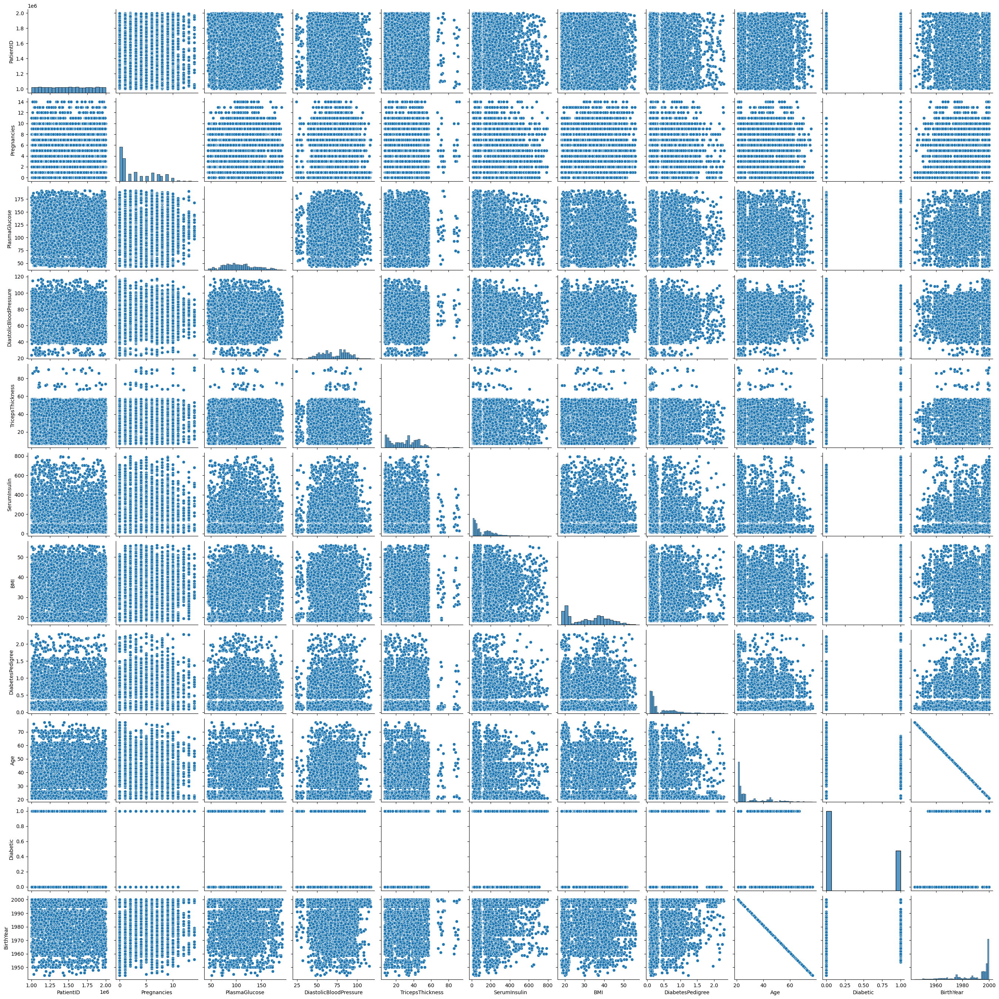

In [13]:
# Perform Joint Grid plot on the dataset and plot the graphs
sns.pairplot(data)
plt.show()


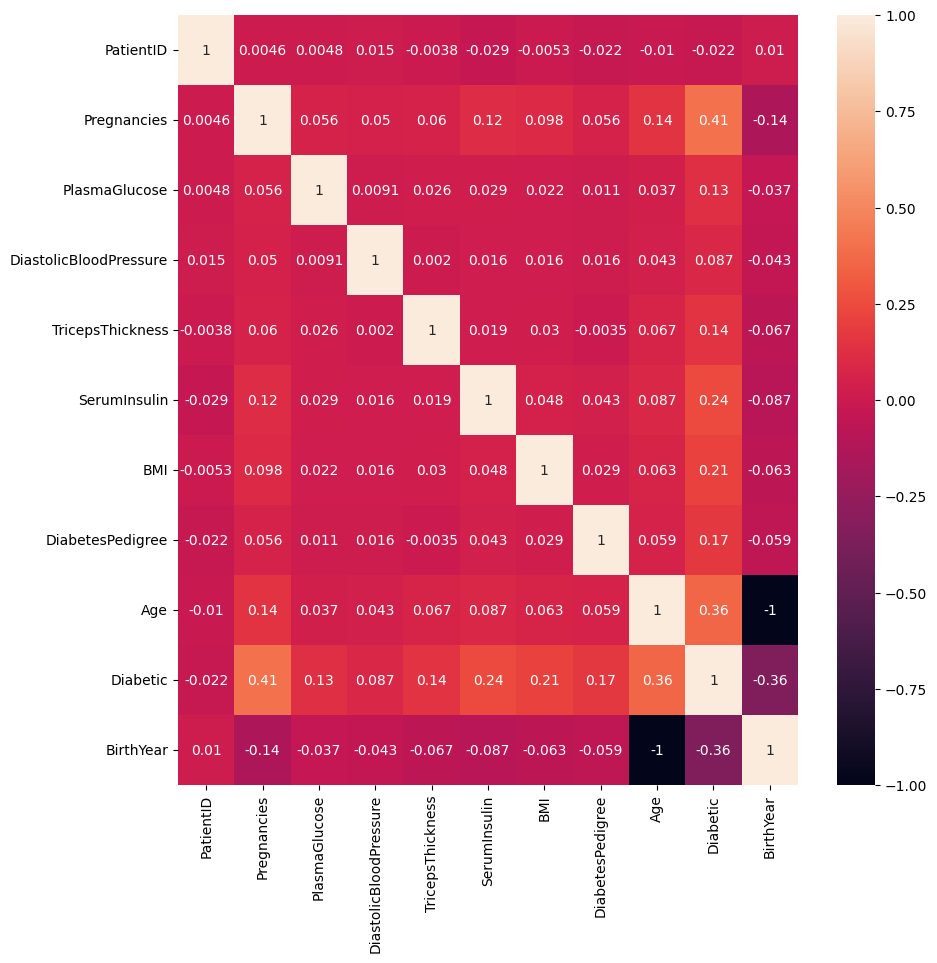

In [14]:
# Perform comparison on all features of the dataset and plot the graphs in a single plot using heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(data.corr(), annot=True)
plt.show()


In [17]:
# Perform standardization on the data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
# show the standardized data
print(X_train)




[[-0.69536898  0.79195948  0.72974792 ... -0.61612437 -0.67191327
   0.67191327]
 [-0.397888   -0.08293247  1.69844331 ... -0.79852154 -0.67191327
   0.67191327]
 [-1.33316399 -0.66619376 -1.64511819 ... -0.48886166 -0.34412072
   0.34412072]
 ...
 [ 1.50323379  0.79195948  0.19852787 ... -0.72642976  0.47536066
  -0.47536066]
 [-0.63300064 -0.66619376 -0.05145804 ... -0.78460204 -0.75386141
   0.75386141]
 [-1.37606278 -0.08293247  0.47976201 ...  0.16544831 -0.42606886
   0.42606886]]


In [19]:
# Create a random forest model with 100 trees, and the criterion is entropy
model = RandomForestClassifier(n_estimators=100, criterion='entropy')



In [20]:
# Calculate the accuracy of the model
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.93
